# Unet Implementation

## Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Load Dataset and extract

In [2]:
!unzip /content/drive/MyDrive/Crop_Row_Detection_Dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_200.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_2000.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_2200.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_2400.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_2800.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_3200.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_3400.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_3600.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_3800.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_400.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_600.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_400_800.tif  
  inflating: Crop Row Detection Dataset/train/Masks/0/1_600_0.tif  
  inflating: Crop Row Detection D

## Reconstruction of dataset into a new format

In [3]:
import os
from PIL import Image
from tqdm import tqdm

# Define paths
base_path = '/content/Crop Row Detection Dataset'
new_train_path = './stage1_train'
new_test_path = './stage1_test'

# Create new directories
os.makedirs(new_train_path, exist_ok=True)
os.makedirs(new_test_path, exist_ok=True)

# Helper function to create the new structure
def restructure_data(old_path, new_path, subset):
    img_dir = os.path.join(old_path, subset, 'Images', '0')
    mask_dir = os.path.join(old_path, subset, 'Masks', '0')

    for filename in tqdm(os.listdir(img_dir)):
        if filename.endswith('.tif'):
            file_id = filename.split('.')[0]
            new_dir = os.path.join(new_path, file_id)
            os.makedirs(os.path.join(new_dir, 'images'), exist_ok=True)
            os.makedirs(os.path.join(new_dir, 'masks'), exist_ok=True)

            # Read and save image using Pillow
            img = Image.open(os.path.join(img_dir, filename))
            img.save(os.path.join(new_dir, 'images', f'{file_id}.png'))

            # Read and save mask using Pillow
            mask = Image.open(os.path.join(mask_dir, filename))
            mask.save(os.path.join(new_dir, 'masks', f'{file_id}.png'))

# Restructure train and test data
restructure_data(base_path, new_train_path, 'train')
restructure_data(base_path, new_test_path, 'test')



100%|██████████| 509/509 [01:14<00:00,  6.84it/s]


Resizing training images and masks


100%|██████████| 4071/4071 [03:43<00:00, 18.24it/s]


Resizing test images


100%|██████████| 509/509 [00:21<00:00, 23.22it/s]


Done!


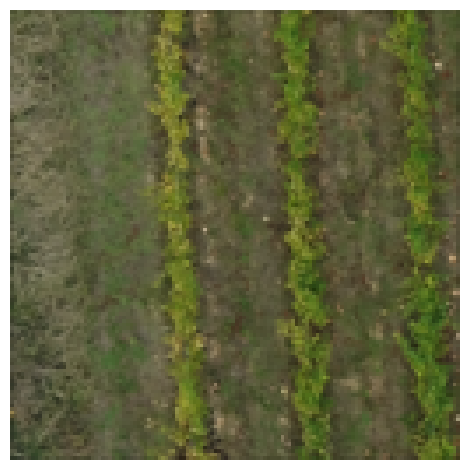

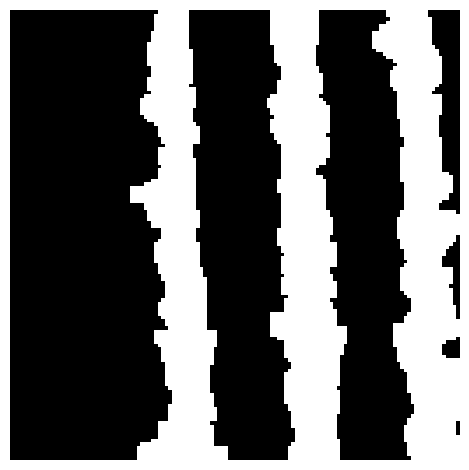

In [4]:
import tensorflow as tf
import os
import random
import numpy as np
from tqdm import tqdm
from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

seed = 42
np.random.seed = seed

IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3

TRAIN_PATH = './stage1_train/'
TEST_PATH = './stage1_test/'

train_ids = next(os.walk(TRAIN_PATH))[1]
test_ids = next(os.walk(TEST_PATH))[1]

X = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
y = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)

__author__ = "Sreenivas Bhattiprolu"
__license__ = "Feel free to copy, I appreciate if you acknowledge Python for Microscopists"

# Credits https://github.com/bnsreenu/python_for_microscopists

"""
@author: Sreenivas Bhattiprolu
"""

print('Resizing training images and masks')
for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):
    path = TRAIN_PATH + id_
    img = imread(path + '/images/' + id_ + '.png')[:,:,:IMG_CHANNELS]
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X[n] = img  #Fill empty X_train with values from img
    mask = np.zeros((IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)
    for mask_file in next(os.walk(path + '/masks/'))[2]:
        mask_ = imread(path + '/masks/' + mask_file)
        if mask_.ndim == 3 and mask_.shape[2] == 3:
            mask_ = mask_[:,:,0]  # Convert 3-channel mask to single channel if necessary
        mask_ = np.expand_dims(resize(mask_, (IMG_HEIGHT, IMG_WIDTH), mode='constant',
                                      preserve_range=True), axis=-1)
        mask = np.maximum(mask, mask_)

    y[n] = mask

# test images
test_images = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
sizes_test = []
print('Resizing test images')
for n, id_ in tqdm(enumerate(test_ids), total=len(test_ids)):
    path = TEST_PATH + id_
    img = imread(path + '/images/' + id_ + '.png')[:,:,:IMG_CHANNELS]
    sizes_test.append([img.shape[0], img.shape[1]])
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    test_images[n] = img

print('Done!')

# Split into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.33, random_state=42)

# Visualize random sample from training set
image_x = random.randint(0, len(X_train) - 1)
plt.axis("off")
imshow(X_train[image_x])
plt.show()
plt.axis("off")
imshow(np.squeeze(y_train[image_x]))
plt.show()


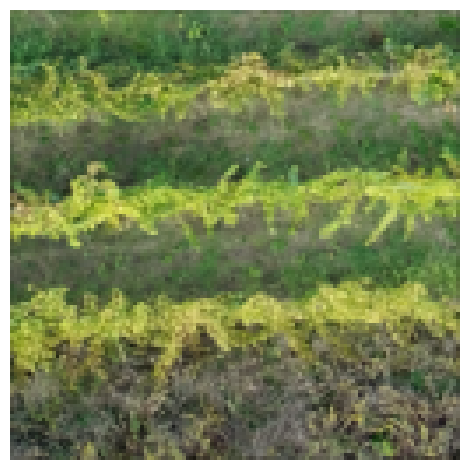

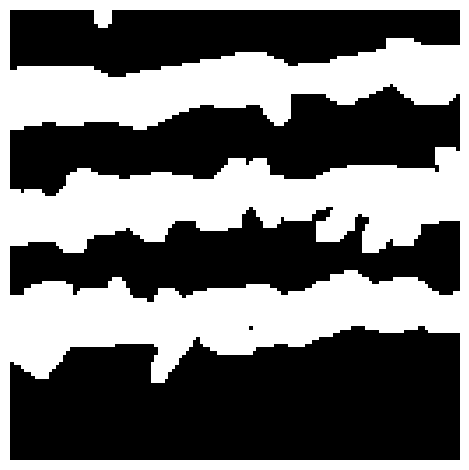

In [5]:
# Visualize random sample from training set
image_x = random.randint(0, len(X_train) - 1)
plt.axis("off")
imshow(X_train[image_x])
plt.show()
plt.axis("off")
imshow(np.squeeze(y_train[image_x]))
plt.show()


## Model Definition

In [6]:
import tensorflow as tf
import os
import random
import numpy as np
from tqdm import tqdm
from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Parameters
num_classes = 1

# Define the model
inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

# Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
b1 = tf.keras.layers.BatchNormalization()(c1)
r1 = tf.keras.layers.ReLU()(b1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(r1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
b2 = tf.keras.layers.BatchNormalization()(c2)
r2 = tf.keras.layers.ReLU()(b2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(r2)

c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
b3 = tf.keras.layers.BatchNormalization()(c3)
r3 = tf.keras.layers.ReLU()(b3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(r3)

c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
b4 = tf.keras.layers.BatchNormalization()(c4)
r4 = tf.keras.layers.ReLU()(b4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(r4)

c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
b5 = tf.keras.layers.BatchNormalization()(c5)
r5 = tf.keras.layers.ReLU()(b5)
c5 = tf.keras.layers.Dropout(0.3)(r5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

# Expansive path
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
u6 = tf.keras.layers.BatchNormalization()(u6)
u6 = tf.keras.layers.ReLU()(u6)

u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(u6)
u7 = tf.keras.layers.concatenate([u7, c3])
u7 = tf.keras.layers.BatchNormalization()(u7)
u7 = tf.keras.layers.ReLU()(u7)

u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(u7)
u8 = tf.keras.layers.concatenate([u8, c2])
u8 = tf.keras.layers.BatchNormalization()(u8)
u8 = tf.keras.layers.ReLU()(u8)

u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(u8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
u9 = tf.keras.layers.BatchNormalization()(u9)
u9 = tf.keras.layers.ReLU()(u9)

outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='sigmoid')(u9)

model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 128, 128, 16)   │            448 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 128, 128, 16)   │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 128, 128, 16)   │          2,320 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 128, 128, 16)   │             64 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 128, 128, 16)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 64, 64, 16)     │              0 │ re_lu[0][0]            │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 64, 64, 32)     │          4,640 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 64, 64, 32)     │              0 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 64, 64, 32)     │          9,248 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 64, 64, 32)     │            128 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 64, 64, 32)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 32, 32, 32)     │              0 │ re_lu_1[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 32, 32, 64)     │         18,496 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 32, 32, 64)     │              0 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 32, 32, 64)     │         36,928 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 32, 32, 64)     │            256 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 1,400,033 (5.34 MB)

 Trainable params: 1,398,081 (5.33 MB)

 Non-trainable params: 1,952 (7.62 KB)

In [16]:
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])

def iou_metric(y_true, y_pred):
    # Threshold predictions
    y_pred = tf.cast(y_pred > 0.5, tf.int32)

    # Compute intersection and union
    intersection = tf.reduce_sum(tf.cast(y_true, tf.int32) * y_pred)
    union = tf.reduce_sum(tf.cast(y_true, tf.int32) + y_pred) - intersection

    # Avoid division by zero
    iou = tf.cond(union > 0,
                  lambda: tf.cast(intersection, tf.float32) / tf.cast(union, tf.float32),
                  lambda: tf.constant(1.0, dtype=tf.float32))
    return iou

def f1_score(y_true, y_pred):
    y_pred = tf.cast(y_pred > 0.5, tf.int32)
    y_true = tf.cast(y_true, tf.int32)  # Ensure y_true is also int

    true_positive = tf.cast(tf.reduce_sum(y_true * y_pred), tf.float32)
    false_positive = tf.cast(tf.reduce_sum((1 - y_true) * y_pred), tf.float32)
    false_negative = tf.cast(tf.reduce_sum(y_true * (1 - y_pred)), tf.float32)

    precision = true_positive / (true_positive + false_positive + tf.keras.backend.epsilon())
    recall = true_positive / (true_positive + false_negative + tf.keras.backend.epsilon())
    f1 = 2 * (precision * recall) / (precision + recall + tf.keras.backend.epsilon())
    return f1




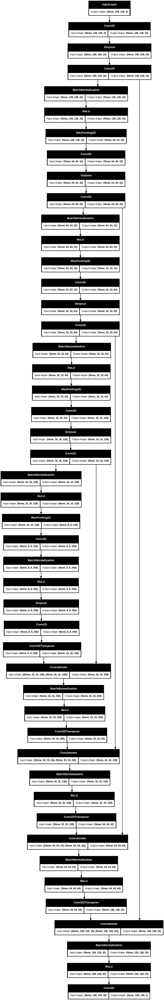

In [8]:
tf.keras.utils.plot_model(model, "model.png", show_shapes=True)


In [17]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard

# Define the callbacks
callbacks = [
    EarlyStopping(patience=2, monitor='val_loss'),
    ModelCheckpoint(
        filepath='/content/drive/MyDrive/crop_row_detection_best_model.keras',
        monitor='val_iou_metric',  # Change this to 'val_loss' if you prefer loss monitoring
        save_best_only=True,
        mode='max',
        verbose=1
    ),
    TensorBoard(log_dir='/content/drive/MyDrive/logs')  # Save TensorBoard logs to Google Drive
]

In [18]:
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy', iou_metric, f1_score])


## Model Training

In [19]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    batch_size=8,
    epochs=50,
    callbacks=callbacks
)


Epoch 1/50
341/341 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.8857 - f1_score: 0.7928 - iou_metric: 0.6740 - loss: 0.3167
Epoch 1: val_iou_metric improved from -inf to 0.80365, saving model to /content/drive/MyDrive/crop_row_detection_best_model.keras
341/341 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8858 - f1_score: 0.7930 - iou_metric: 0.6743 - loss: 0.3164 - val_accuracy: 0.9495 - val_f1_score: 0.8908 - val_iou_metric: 0.8037 - val_loss: 0.1271
Epoch 2/50
340/341 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.9479 - f1_score: 0.8921 - iou_metric: 0.8058 - loss: 0.1320
Epoch 2: val_iou_metric improved from 0.80365 to 0.81595, saving model to /content/drive/MyDrive/crop_row_detection_best_model.keras
341/341 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9479 - f1_score: 0.8921 - iou_metric: 0.8058 - loss: 0.1320 - val_accuracy: 0.9529 - val_f1_score: 0.8982 - val_iou_metric: 0.8160 - val_loss: 0.1164
Epoch 3/50
339/341 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.953

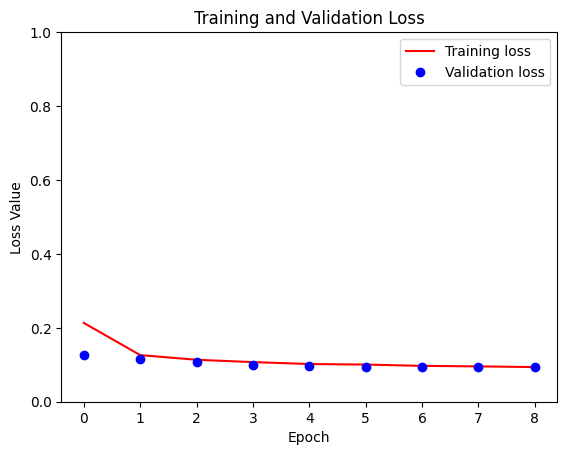

In [20]:
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure()
plt.plot(loss, 'r', label='Training loss')
plt.plot(val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()


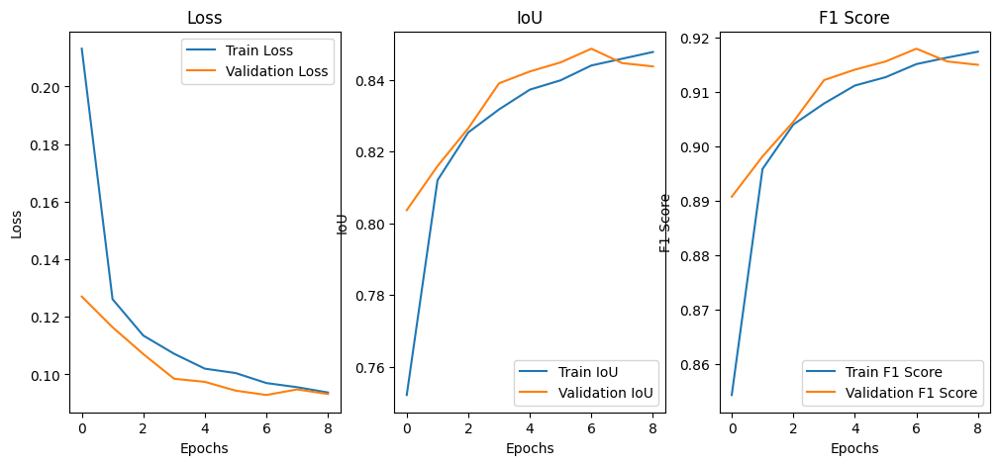

In [21]:
# Plot training & validation loss and IoU
plt.figure(figsize=(12, 5))

# Loss
plt.subplot(1, 3, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# IoU
plt.subplot(1, 3, 2)
plt.plot(history.history['iou_metric'], label='Train IoU')
plt.plot(history.history['val_iou_metric'], label='Validation IoU')
plt.title('IoU')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()

# F1 Score
plt.subplot(1, 3, 3)
plt.plot(history.history['f1_score'], label='Train F1 Score')
plt.plot(history.history['val_f1_score'], label='Validation F1 Score')
plt.title('F1 Score')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()

plt.show()


In [24]:
test_loss, test_accuracy, test_iou, test_f1 = model.evaluate(X_val, y_val, verbose=1)

# Print the overall results
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test IoU: {test_iou:.4f}')
print(f'Test F1 Score: {test_f1:.4f}')


42/42 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.9598 - f1_score: 0.9161 - iou_metric: 0.8452 - loss: 0.0943
Test Loss: 0.0932
Test Accuracy: 0.9603
Test IoU: 0.8454
Test F1 Score: 0.9161


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have test_images and y_test already prepared

# 1. Evaluate the model on the test dataset
test_loss, test_accuracy, test_iou = model.evaluate(test_images, y_test, verbose=1)

# 2. Print the overall results
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test IoU: {test_iou:.4f}')

# 3. Make predictions on the test data
predictions = model.predict(test_images)

# 4. Calculate IoU for each test sample (optional)
def calculate_iou(y_true, y_pred):
    y_pred = (y_pred > 0.5).astype(np.uint8)
    intersection = np.sum(y_true & y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return intersection / union if union != 0 else 1.0

# Compute IoU for all test samples
ious = []
for i in range(len(test_images)):
    iou = calculate_iou(y_test[i].astype(np.uint8), predictions[i].astype(np.uint8))
    ious.append(iou)

mean_iou = np.mean(ious)
print(f'Mean IoU on Test Data: {mean_iou:.4f}')


NameError: name 'y_test' is not defined

## Display Predictions

In [25]:
def display(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


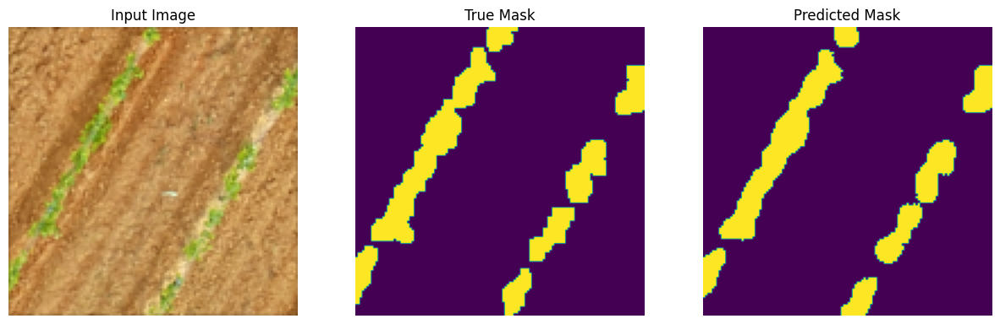

In [26]:
i = random.randint(0, len(X_val) - 1)  # Select a random sample from the validation set
sample_image = X_val[i]
sample_mask = y_val[i]
prediction = model.predict(sample_image[tf.newaxis, ...])[0]
predicted_mask = (prediction > 0.5).astype(np.uint8)

display([sample_image, sample_mask, predicted_mask])


## Display multiple Predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━

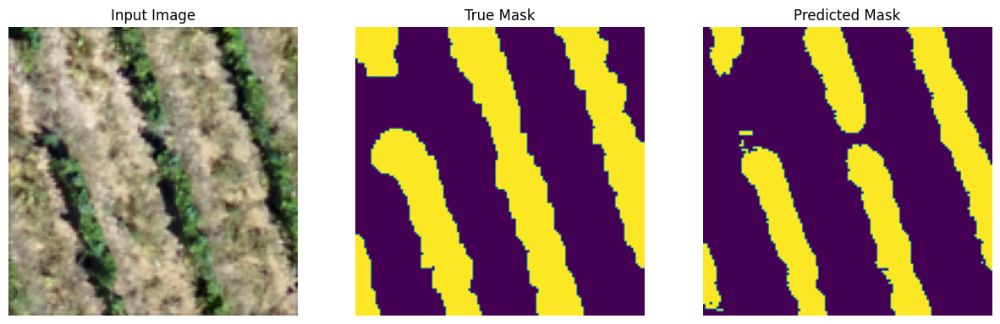

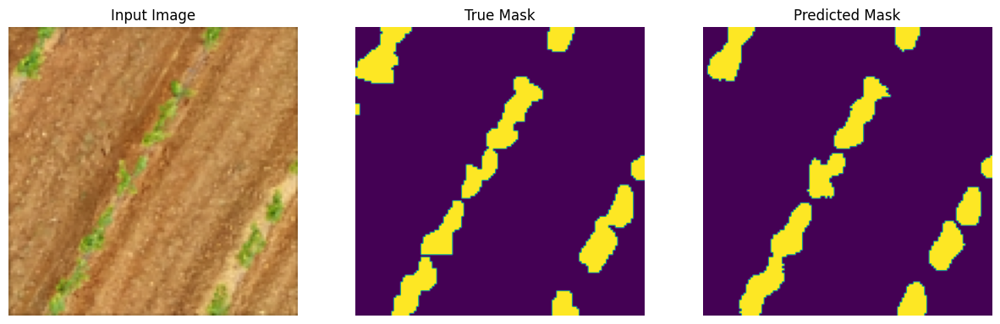

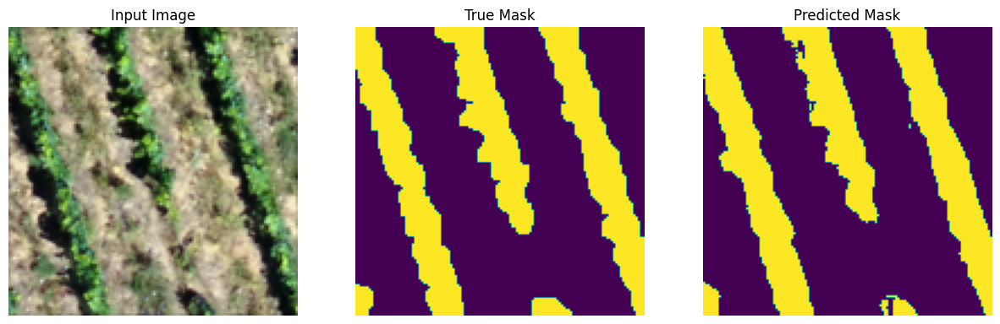

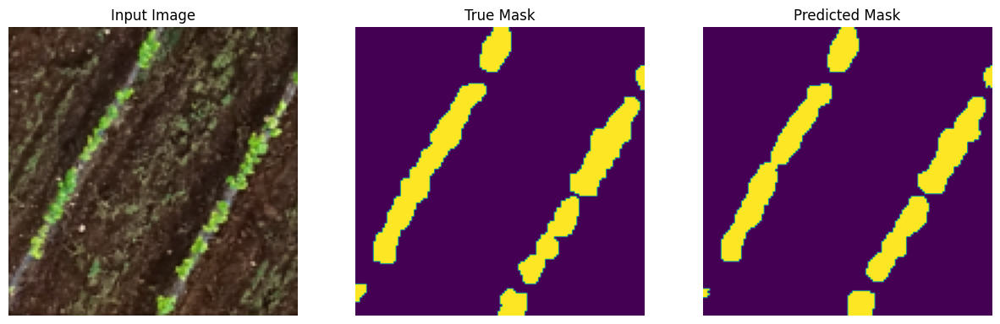

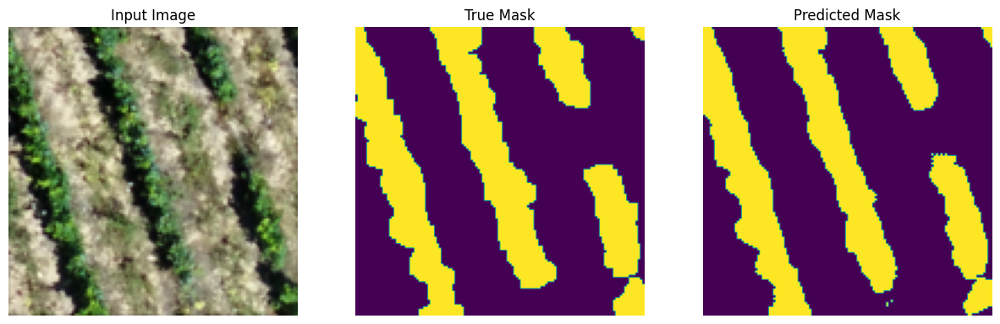

...

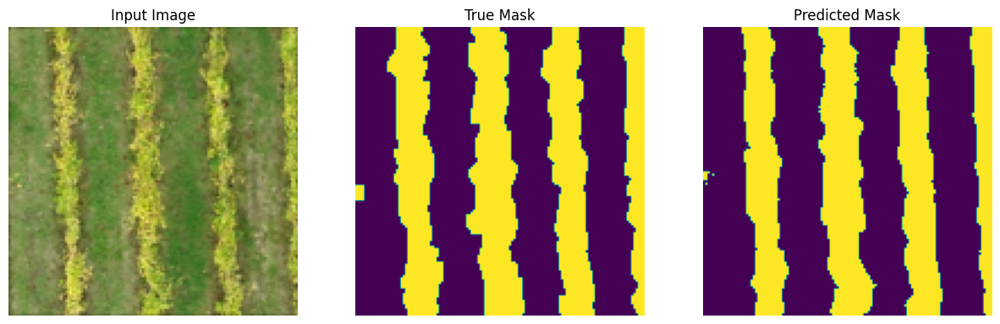

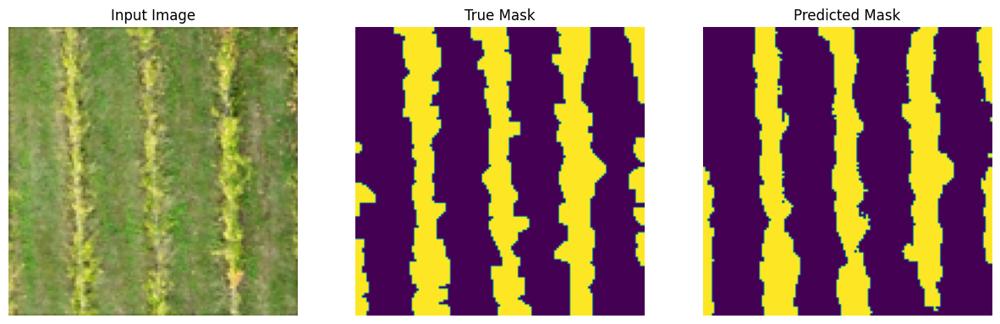

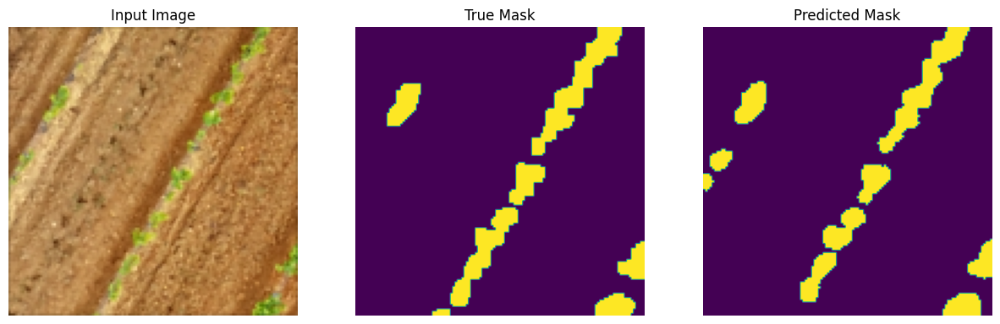

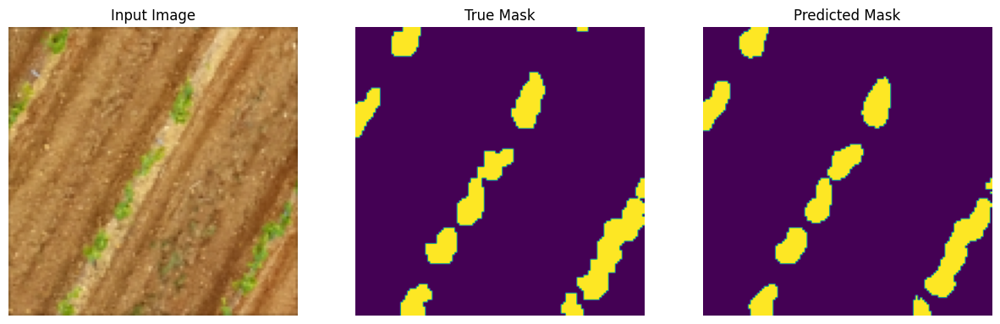

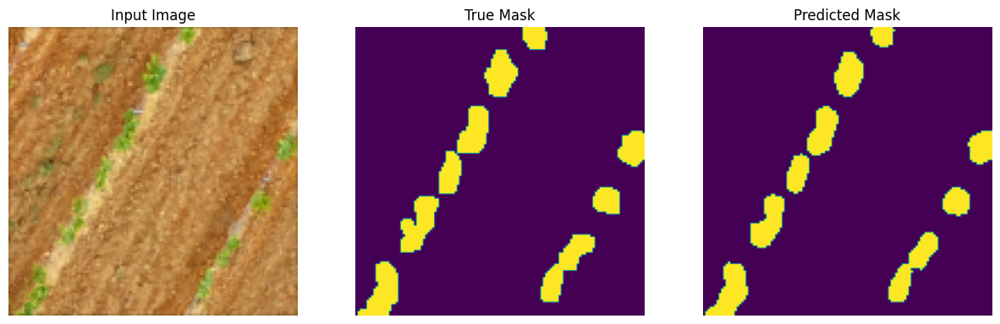

In [27]:
# Function to display multiple predictions
def display_multiple_predictions(display_list, num_samples=50):
    for idx in range(num_samples):
        plt.figure(figsize=(15, 5))

        sample_image = display_list[idx][0]
        sample_mask = display_list[idx][1]
        predicted_mask = display_list[idx][2]

        plt.subplot(1, 3, 1)
        plt.title('Input Image')
        plt.imshow(tf.keras.utils.array_to_img(sample_image))
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title('True Mask')
        plt.imshow(tf.keras.utils.array_to_img(sample_mask))
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title('Predicted Mask')
        plt.imshow(tf.keras.utils.array_to_img(predicted_mask))
        plt.axis('off')

        plt.show()

# Select 50 random samples from the validation set
num_samples = 50
indices = random.sample(range(len(X_val)), num_samples)
sample_predictions = []

for i in indices:
    sample_image = X_val[i]
    sample_mask = y_val[i]
    prediction = model.predict(sample_image[tf.newaxis, ...])[0]
    predicted_mask = (prediction > 0.5).astype(np.uint8)
    sample_predictions.append((sample_image, sample_mask, predicted_mask))

# Display the predictions
display_multiple_predictions(sample_predictions, num_samples)


## Save and download the Model

In [ ]:
# Save the entire model
model.save('crop_row_detection_model2.h5')


In [ ]:
from google.colab import files

# Download the model
files.download('crop_row_detection_model2.h5')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Now We load the model and predict on test data

In [ ]:
from tensorflow.keras.layers import Conv2DTranspose as KerasConv2DTranspose

class CustomConv2DTranspose(KerasConv2DTranspose):
    def __init__(self, *args, **kwargs):
        if 'groups' in kwargs:
            del kwargs['groups']  # Remove unsupported argument
        super().__init__(*args, **kwargs)

# Then load your model with the custom layer
model = load_model(model_path, custom_objects={
    'iou_metric': iou_metric,
    'Conv2DTranspose': CustomConv2DTranspose
})


In [ ]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from tensorflow.keras.models import load_model
from tqdm import tqdm

# Define the IoU metric
def iou_metric(y_true, y_pred):
    y_pred = tf.cast(y_pred > 0.5, tf.int32)

    intersection = tf.reduce_sum(tf.cast(y_true, tf.int32) * y_pred)
    union = tf.reduce_sum(tf.cast(y_true, tf.int32) + y_pred) - intersection

    iou = tf.cond(union > 0, lambda: intersection / union, lambda: tf.constant(1.0))
    return iou

# Load the model
model_path = '/content/crop_row_detection_model.h5'
model = load_model(model_path, custom_objects={'iou_metric': iou_metric})

# Load test images (assuming you've done this already)
# Assuming 'test_images' is already defined as per your earlier code

# Make predictions on the test data
predictions = model.predict(test_images)

# Define a function to calculate IoU
def calculate_iou(y_true, y_pred):
    y_pred = (y_pred > 0.5).astype(np.uint8)
    intersection = np.sum(y_true & y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return intersection / union if union != 0 else 1.0

# Calculate IoU for all test samples
ious = []
for i in range(len(test_ids)):
    iou = calculate_iou(y_test[i], predictions[i])
    ious.append(iou)

mean_iou = np.mean(ious)
print(f'Mean IoU on Test Data: {mean_iou:.4f}')

# Display predictions for a random sample from the test set
def display(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i + 1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

# Select a random sample to visualize
sample_index = random.randint(0, len(test_images) - 1)
sample_image = test_images[sample_index]
true_mask = y_test[sample_index]
predicted_mask = (predictions[sample_index] > 0.5).astype(np.uint8)

display([sample_image, true_mask, predicted_mask])


TypeError: Error when deserializing class 'Conv2DTranspose' using config={'name': 'conv2d_transpose', 'trainable': True, 'dtype': 'float32', 'filters': 128, 'kernel_size': [2, 2], 'strides': [2, 2], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'module': 'keras.initializers', 'class_name': 'GlorotUniform', 'config': {'seed': None}, 'registered_name': None}, 'bias_initializer': {'module': 'keras.initializers', 'class_name': 'Zeros', 'config': {}, 'registered_name': None}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None, 'output_padding': None}.

Exception encountered: Unrecognized keyword arguments passed to Conv2DTranspose: {'groups': 1}

In [ ]:
import tensorflow as tf
print(tf.__version__)

2.17.0
